### Student Information
Name:林孟翰

Student ID:108061529

GitHub ID:108061529

---

### Instructions

1. First: do the **take home** exercises in the [DM19-Lab1-Master Repo](https://github.com/EvaArevalo/DM19-Lab1-Master). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM19-Lab1-Master Repo](https://github.com/EvaArevalo/DM19-Lab1-Master) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://archive.ics.uci.edu/ml/datasets/Sentiment+Labelled+Sentences#). The dataset contains a `sentence` and `score` label. Read the specificiations of the dataset for details. 
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Sciki-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be habdled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy :'(, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/EvaArevalo/DM19-Lab1-Master/blob/master/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (Oct. 29th 11:59 pm, Tuesday)__. 

### Begin Assignment Here
### Part1:Take home Exercises from Lab1
### Cells Needed For Lab Exercises

In [1]:
# necessary for when working with external scripts
%load_ext autoreload
%autoreload 2

# categories
categories = ['alt.atheism', 'soc.religion.christian', 'comp.graphics', 'sci.med']

# obtain the documents containing the categories provided
from sklearn.datasets import fetch_20newsgroups
twenty_train = fetch_20newsgroups(subset='train', categories=categories, \
                                  shuffle=True, random_state=42)

import pandas as pd
# my functions
import helpers.data_mining_helpers as dmh

# construct dataframe from a list
X = pd.DataFrame.from_records(dmh.format_rows(twenty_train), columns= ['text'])

# add category to the dataframe
X['category'] = twenty_train.target

# add category label also
X['category_name'] = X.category.apply(lambda t: dmh.format_labels(t, twenty_train))

# Get a copy of the original X dataframe for later excercise
X_copy = X.copy()

### Lab1 Exercises
###  **>>>Exercise 2:**
Experiment with other querying techniques using pandas dataframes.

In [2]:
#Access Index directly as an attribute, query every 10th record, showing first ten
X.text[::10][0:10]

0     From: sd345@city.ac.uk (Michael Collier) Subje...
10    From: anasaz!karl@anasazi.com (Karl Dussik) Su...
20    From: dotsonm@dmapub.dma.org (Mark Dotson) Sub...
30    From: vgwlu@dunsell.calgary.chevron.com (greg ...
40    From: david-s@hsr.no (David A. Sjoen) Subject:...
50    From: ab@nova.cc.purdue.edu (Allen B) Subject:...
60    From: Nanci Ann Miller <nm0w+@andrew.cmu.edu> ...
70    From: weaver@chdasic.sps.mot.com (Dave Weaver)...
80    From: annick@cortex.physiol.su.oz.au (Annick A...
90    Subject: Vonnegut/atheism From: dmn@kepler.unh...
Name: text, dtype: object

In [3]:
#Access via loc and label slices
X.loc[::10,'text':'category_name'][0:10]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
10,From: anasaz!karl@anasazi.com (Karl Dussik) Su...,3,soc.religion.christian
20,From: dotsonm@dmapub.dma.org (Mark Dotson) Sub...,3,soc.religion.christian
30,From: vgwlu@dunsell.calgary.chevron.com (greg ...,2,sci.med
40,From: david-s@hsr.no (David A. Sjoen) Subject:...,3,soc.religion.christian
50,From: ab@nova.cc.purdue.edu (Allen B) Subject:...,1,comp.graphics
60,From: Nanci Ann Miller <nm0w+@andrew.cmu.edu> ...,0,alt.atheism
70,From: weaver@chdasic.sps.mot.com (Dave Weaver)...,3,soc.religion.christian
80,From: annick@cortex.physiol.su.oz.au (Annick A...,2,sci.med
90,Subject: Vonnegut/atheism From: dmn@kepler.unh...,0,alt.atheism


In [4]:
#Access scalar value with iat
X.iat[0,0]

'From: sd345@city.ac.uk (Michael Collier) Subject: Converting images to HP LaserJet III? Nntp-Posting-Host: hampton Organization: The City University Lines: 14  Does anyone know of a good way (standard PC application/PD utility) to convert tif/img/tga files into LaserJet III format.  We would also like to do the same, converting to HPGL (HP plotter) files.  Please email any response.  Is this the correct group?  Thanks in advance.  Michael. --  Michael Collier (Programmer)                 The Computer Unit, Email: M.P.Collier@uk.ac.city                The City University, Tel: 071 477-8000 x3769                      London, Fax: 071 477-8565                            EC1V 0HB. '

###  **>>>Exercise 5:**

There is an old saying that goes, "The devil is in the details." When we are working with extremely large data, it's difficult to check records one by one (as we have been doing so far). And also, we don't even know what kind of missing values we are facing. Thus, "debugging" skills get sharper as we spend more time solving bugs. Let's focus on a different method to check for missing values and the kinds of missing values you may encounter. It's not easy to check for missing values as you will find out in a minute.

Please check the data and the process below, describe what you observe and why it happened.

$Hint$ :  why `.isnull()` didn't work?

In [5]:
import numpy as np

NA_dict = [{ 'id': 'A', 'missing_example': np.nan },
           { 'id': 'B'                    },
           { 'id': 'C', 'missing_example': 'NaN'  },
           { 'id': 'D', 'missing_example': 'None' },
           { 'id': 'E', 'missing_example':  None  },
           { 'id': 'F', 'missing_example': ''     }]

NA_df = pd.DataFrame(NA_dict, columns = ['id','missing_example'])
NA_df

,id,missing_example
0,A,NaN
1,B,NaN
2,C,NaN
3,D,None
4,E,None
5,F,


In [6]:
NA_df['missing_example'].isnull()

0     True
1     True
2    False
3    False
4     True
5    False
Name: missing_example, dtype: bool

In [7]:
# Answer here
# isnull(): indictates whether values are missing (NaN in numeric arrays, None or NaN in object arrays, NaT in datetimelike)
NA_df['missing_example']

0     NaN
1     NaN
2     NaN
3    None
4    None
5        
Name: missing_example, dtype: object

isnull() indicates None or NaN in array-like objects.

For A, the value is NaN, which will be captured by isnull()

For B, the value is missing, which will be captured by isnull()

For C and D, the values are the strings "NaN" and "None", they are not missing, so they won't be captured by isnull()

For E, None is captured by isnull(), according to the documentation

For F, the value is the empty string '', it is not missing, so it won't be captured by isnull()

### Cells Needed For Lab Exercises 6, 8

In [8]:
# Duplicate Operations
dummy_duplicate_dict = [{
                             'text': 'dummy record',
                             'category': 1, 
                             'category_name': "dummy category"
                        },
                        {
                             'text': 'dummy record',
                             'category': 1, 
                             'category_name': "dummy category"
                        }]
X = X.append(dummy_duplicate_dict, ignore_index=True)
X.drop_duplicates(keep=False, inplace=True) # inplace applies changes directly on our dataframe

# Sampling Operations
X_sample = X.sample(n=1000) #random state

###  **>>>Exercise 6:**

Notice any changes to the `X` dataframe? What are they? Report every change you noticed as compared to the previous state of `X`. Feel free to query and look more closely at the dataframe for these changes.

In [9]:
# Answer here
X.equals(X_copy)

True

According to the documentation: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.equals.html, equals() allows two Series or DataFrames to be compared against each other to see if they have the same shape and elements.
X_copy is the copy of the dataframe X before all operations. "True" means all elements are the same in both objects.

In [10]:
X_sample[0:10]

,text,category,category_name
966,From: bobbe@vice.ICO.TEK.COM (Robert Beauchain...,0,alt.atheism
990,From: Patrick C Leger <pl1u+@andrew.cmu.edu> S...,0,alt.atheism
534,From: gt7122b@prism.gatech.edu (boundary) Subj...,3,soc.religion.christian
451,From: jmunch@hertz.elee.calpoly.edu (John Munc...,0,alt.atheism
1209,Subject: Re: Broken rib From: jc@oneb.almanac....,2,sci.med
426,From: pww@spacsun.rice.edu (Peter Walker) Subj...,0,alt.atheism
1488,From: Petch@gvg47.gvg.tek.com (Chuck Petch) Su...,3,soc.religion.christian
172,From: thinman@netcom.com (Technically Sweet) S...,1,comp.graphics
1052,From: bassili@cs.arizona.edu (Amgad Z. Bassili...,3,soc.religion.christian
1255,From: fulk@cs.rochester.edu (Mark Fulk) Subjec...,2,sci.med


In [11]:
X[0:10]

,text,category,category_name
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med
9,From: libman@hsc.usc.edu (Marlena Libman) Subj...,2,sci.med


As for differences between X and X_sample, we  can see from above that the order of documents are random too. Also, sampled documents will be different every time because we did not fix the random seed of the sample function.

###  **>>>Exercise 8:**
We can also do a side-by-side comparison of the distribution between the two datasets, but maybe you can try that as an excerise. Below we show you an snapshot of the type of chart we are looking for.

![alt txt](https://i.imgur.com/9eO431H.png)

soc.religion.christian    599
sci.med                   594
comp.graphics             584
alt.atheism               480
Name: category_name, dtype: int64

soc.religion.christian    281
sci.med                   272
comp.graphics             237
alt.atheism               210
Name: category_name, dtype: int64

Index(['soc.religion.christian', 'sci.med', 'comp.graphics', 'alt.atheism'], dtype='object')


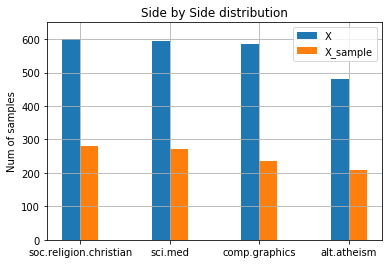

In [12]:
# Answer Here
import matplotlib.pyplot as plt
%matplotlib inline

# the distribution of the data
distribution_X = X.category_name.value_counts()
distribution_sample = X_sample.category_name.value_counts()
print(distribution_X)
print("")
print(distribution_sample)
print("")

# Get the categories(labels for X axis)
X_label = X.category_name.value_counts().index
print(X_label)

# Plot the figure
plt.figure()  
index = np.arange(0,len(X_label)) # for positioning the bars
bar_width = 0.2                   # set the width of the bars

# Bar plot for Distribution of X
A = plt.bar(index+0.9,
           distribution_X, 
           bar_width,
           alpha=1,
           label="X")              # Legend
# Bar plot for Distribution of X_sample
B = plt.bar(index+1.1,
            distribution_sample,
            bar_width,
            alpha=1,
            label="X_sample")      # Legend
plt.ylabel("Num of samples")
plt.xticks(index+1, list(X_label)) # Labels at X axis
plt.title('Side by Side distribution')
plt.legend()                       # Show legend on the plot
plt.ylim(0,650)
plt.grid(True)                     # Plot grid, better for visualization
plt.show()

### Cells Needed For Lab Exercises 10

In [13]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
X_counts = count_vect.fit_transform(X.text)
analyze = count_vect.build_analyzer()
# we convert from sparse array to normal array
X_counts[0:5, 0:100].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0,

### **>>> Exercise 10 (take home):**

We said that the `1` at the beginning of the fifth record represents the `00` term. Notice that there is another 1 in the same record. Can you provide code that can verify what word this 1 represents from the vocabulary. Try to do this as efficient as possible.

In [14]:
# Answer here
import numpy as np
feat_names = count_vect.get_feature_names()[0:100]      # Get names for first 100 features
idx = np.where(X_counts[4, 0:100].toarray()[0] == 1)[0] # Get indices of the term that occurs in the document
print("Indexes of 1s: ", idx)
print("The term is: ",feat_names[idx[1]])               # Get the term and print

Indexes of 1s:  [ 0 37]
The term is:  01


### Cells Needed For Lab Exercises 11

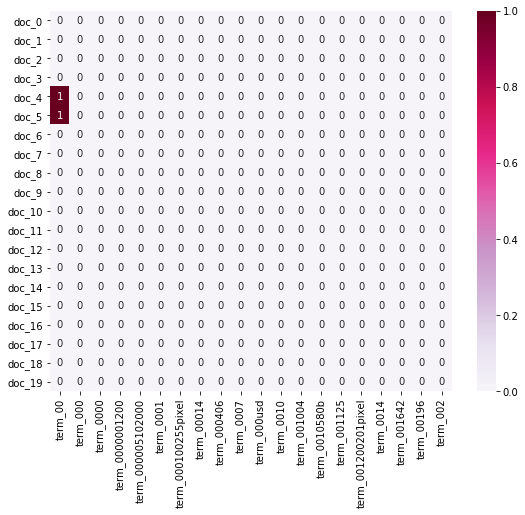

In [15]:
# first twenty features only
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names()[0:20]]

# obtain document index
plot_y = ["doc_"+ str(i) for i in list(X.index)[0:20]]

plot_z = X_counts[0:20, 0:20].toarray()

import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=True)

### **>>> Exercise 11 (take home):** 
From the chart above, we can see how sparse the term-document matrix is; i.e., there is only one terms with frequency of `1` in the subselection of the matrix. By the way, you may have noticed that we only selected 20 articles and 20 terms to plot the histrogram. As an excersise you can try to modify the code above to plot the entire term-document matrix or just a sample of it. How would you do this efficiently? Remember there is a lot of words in the vocab. Report below what methods you would use to get a nice and useful visualization

#### Ans1:

In order to reduce the size of the heatmap, we can randomly sample 50 documents and 50 terms each to plot the heatmap.

In [16]:
from random import sample 
# Sample 50 terms by index
all_feat_idx = list(np.arange(0,len(count_vect.get_feature_names())))
sampled_feat_idx = sample(all_feat_idx,50)
# Sample 50 documents by index
sampled_doc_idx = sample(list(X.index),50)
X_counts_sampled = X_counts[:,sampled_feat_idx]
X_counts_sampled = X_counts_sampled[sampled_doc_idx,:]
X_counts_sampled

<50x50 sparse matrix of type '<class 'numpy.int64'>'
	with 19 stored elements in Compressed Sparse Row format>

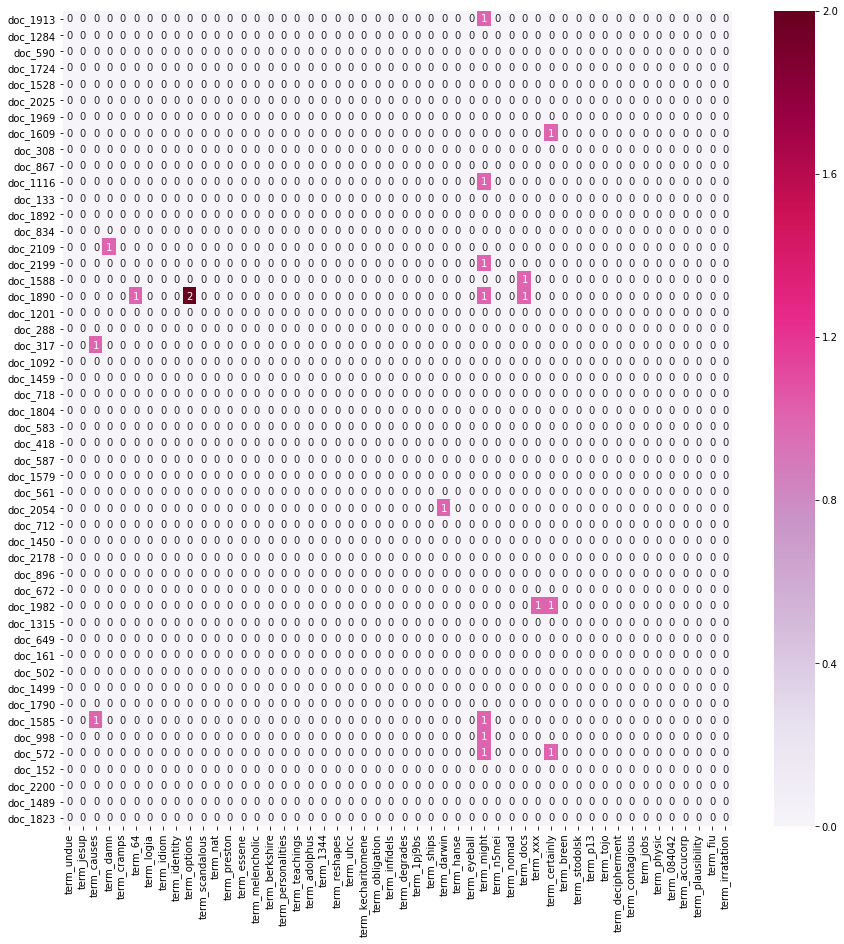

In [17]:
%matplotlib inline
# Get sampled feature names
feat_names = np.array(count_vect.get_feature_names())[sampled_feat_idx]


# first twenty features only
plot_x = ["term_"+str(i) for i in feat_names]

# obtain document index
plot_y = ["doc_"+ str(i) for i in list(X.index[sampled_doc_idx])]

plot_z = X_counts_sampled.toarray()

import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(15, 15))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd", annot=True)

#### Ans2:

We can also randomly sample documents, but filter out terms within a certain range of frequency to show in the heatmap.

In [18]:
# Get terms within a certain frequency range
term_frequencies=np.asarray(X_counts.sum(axis=0))[0]
frequent_terms_idx = np.where(np.multiply(term_frequencies>200,term_frequencies<250))[0] # get term(indices) within frequency range 200~250
z=np.array(count_vect.get_feature_names())
len(z[frequent_terms_idx])

89

In [19]:
# Sample 50 documents by index
sampled_doc_idx = sample(list(X.index),50)
X_counts_sampled = X_counts[:,frequent_terms_idx]
X_counts_sampled = X_counts_sampled[sampled_doc_idx,:]
X_counts_sampled

<50x89 sparse matrix of type '<class 'numpy.int64'>'
	with 289 stored elements in Compressed Sparse Row format>

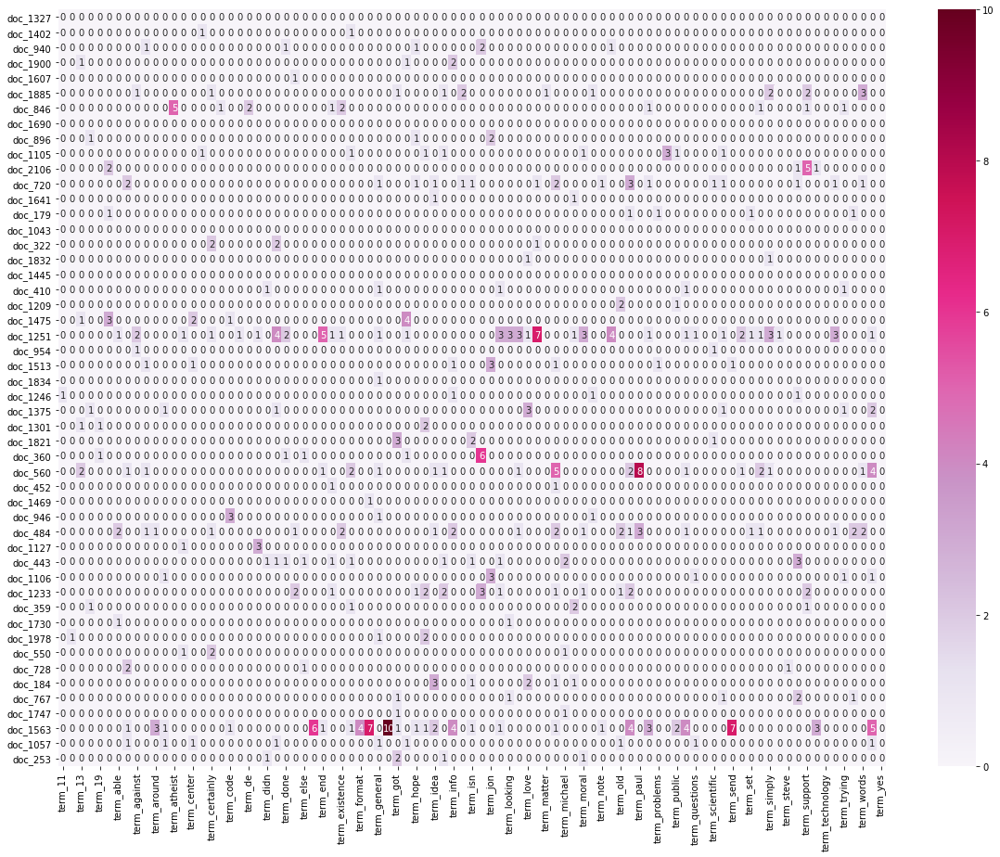

In [20]:
%matplotlib inline
# Get sampled feature names
feat_names = np.array(count_vect.get_feature_names())[frequent_terms_idx]


# first twenty features only
plot_x = ["term_"+str(i) for i in feat_names]

# obtain document index
plot_y = ["doc_"+ str(i) for i in list(X.index[sampled_doc_idx])]

plot_z = X_counts_sampled.toarray()

import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(20, 15))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd", annot=True)

#### Ans3:

It would take a lot of time to plot all terms and docs with seaborn heatmap. If we only want to observe the pattern of the sparse matrix, we can use spy() from matplotlib to visualizes the non-zero values. Although, in this case we cannot observe the frequency of a term, we can only know if the term appears in a certain document.

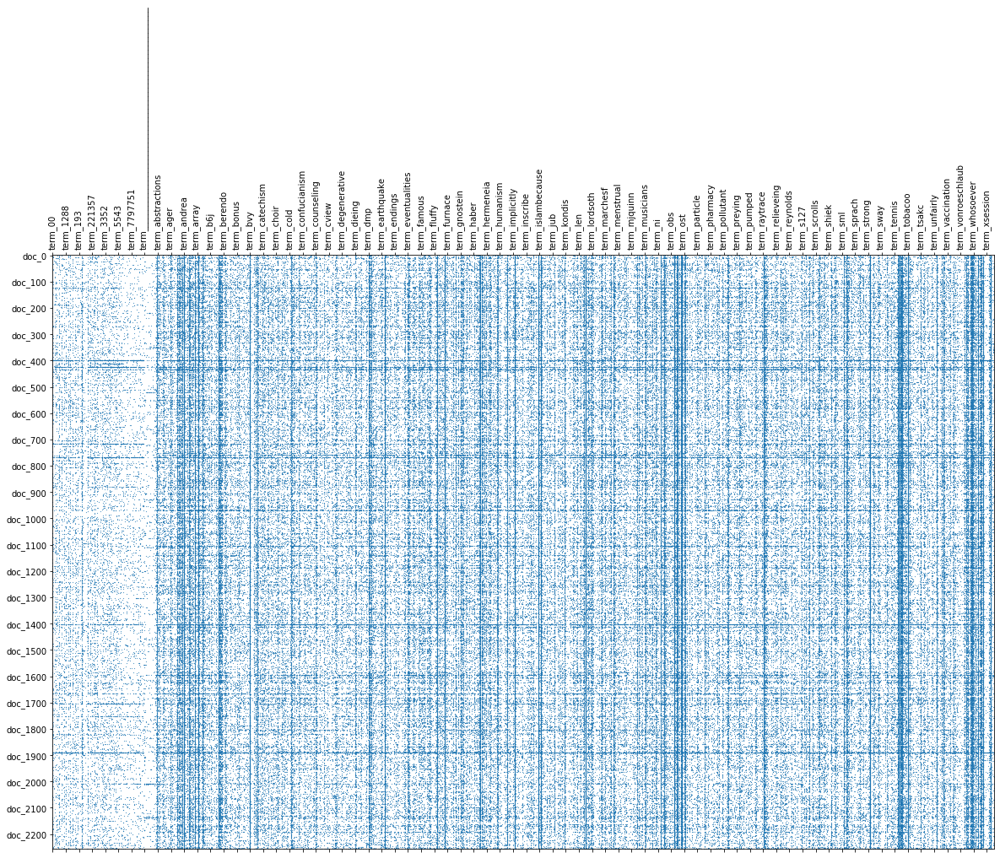

In [21]:
# Answer here
%matplotlib inline
feat_names_all = count_vect.get_feature_names()
feat_names_all = ["term_"+str(i) for i in feat_names_all]
docs_all = ["doc_"+ str(i) for i in list(X.index)]
plt.figure(figsize=(20, 20))                                                # specify size
plt.spy(X_counts,markersize=0.2,aspect=10.0)                                # plot sparse matrix directly
locsX = np.arange(0,X_counts.shape[1],500)                                  # locations where you want to show term
locsY = np.arange(0,len(X.index),100)                                       # locations where you want to show doc
plt.xticks(locsX, np.array(feat_names_all)[locsX.astype(int)],rotation=90)  # show terms on x axis
plt.yticks(locsY, np.array(docs_all)[locsY.astype(int)])                    # show terms on y axis
plt.show()

### >>> Exercise 12 (take home):
Please try to reduce the dimension to 3, and plot the result use 3-D plot. Use at least 3 different angle (camera position) to check your result and describe what you found.

$Hint$: you can refer to Axes3D in the documentation.

(2257, 3)


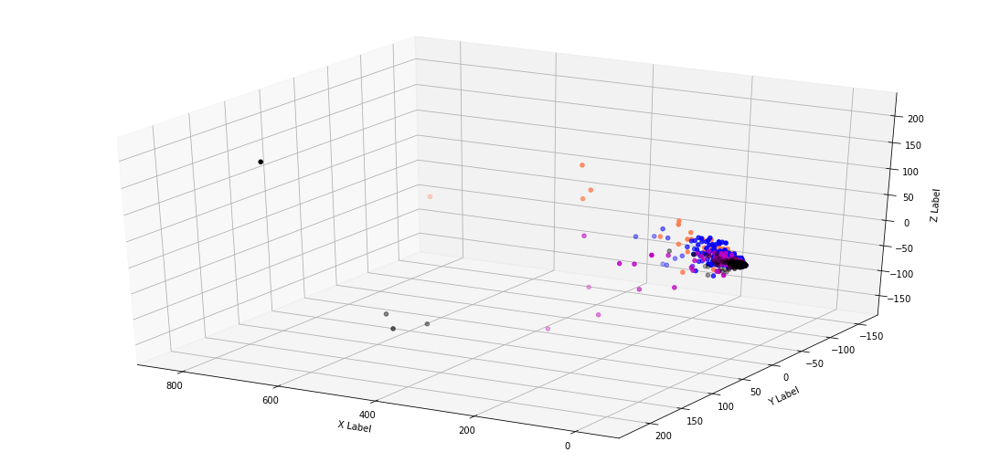

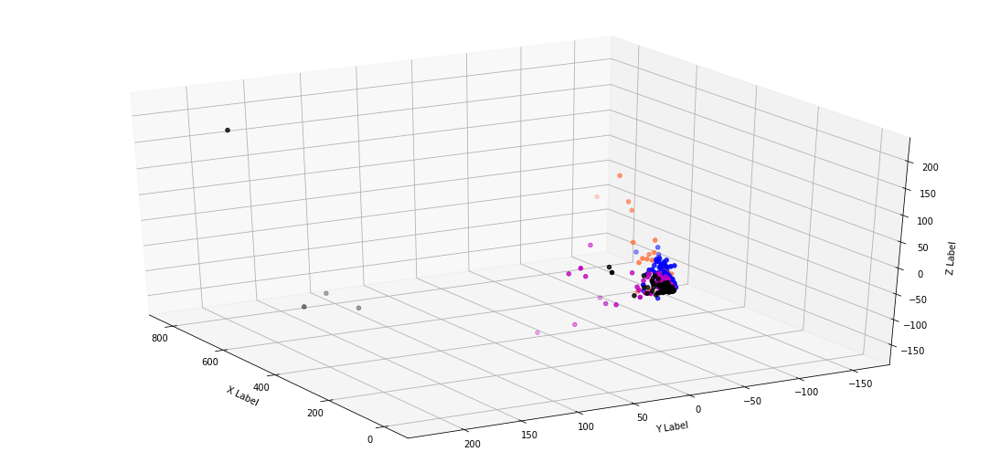

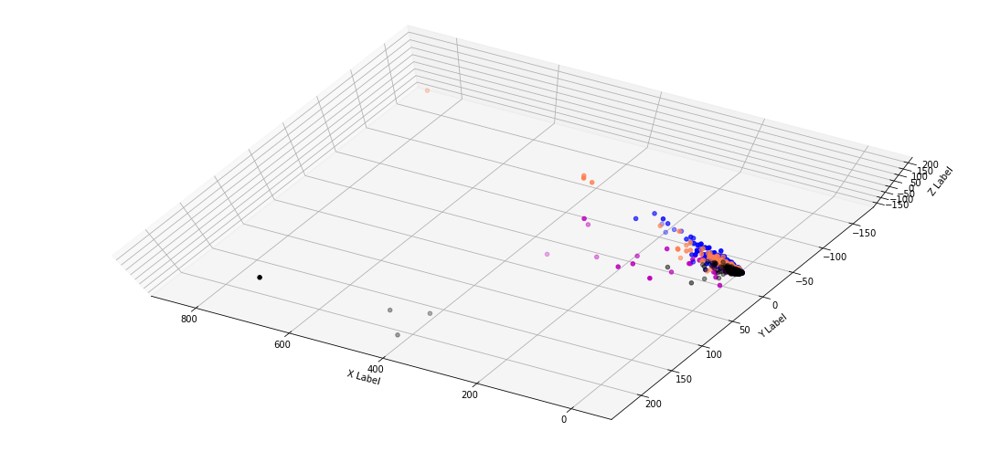

In [22]:
# Answer here
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
X_reduced = PCA(n_components = 3).fit_transform(X_counts.toarray())
print(X_reduced.shape)

# function to plot 3d-plot
def plot_3d(X_reduced, a, b, categories):                        # a: elevation, b: azimuth
    col = ['coral', 'blue', 'black', 'm']

    # plot
    fig = plt.figure(figsize = (15,7))
    ax = Axes3D(fig)

    for c, category in zip(col, categories):
        xs = X_reduced[X['category_name'] == category,0]         # x location
        ys = X_reduced[X['category_name'] == category,1]         # y location
        zs = X_reduced[X['category_name'] == category,2]         # z location
   
        ax.scatter(xs, ys, zs, c=c, marker='o')                  # scatter plot for each category

    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_xlabel('\nX Label')
    ax.set_ylabel('\nY Label')
    ax.set_zlabel('\nZ Label')
    ax.view_init(a,b)                                            # set camera position
    plt.show()
    return ax
    
angles=[[30,120], [30,150], [80,120]]                            # give different angles
for ang in angles:
    ax = plot_3d(X_reduced, ang[0], ang[1], categories)

### Cells needed for Exercise 13

In [23]:
term_frequencies=np.asarray(X_counts.sum(axis=0))[0]

### >>> **Exercise 13 (take home):**
If you want a nicer interactive visualization here, I would encourage you try to install and use plotly to achieve this.

In [24]:
# Answer here
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)   
fig = go.Figure(                                              # plotly gragh object
    data=[go.Bar(y=term_frequencies)],
    layout_title_text="Term Frequency"
)
fig.update_yaxes(range=[0,400])
fig.update_xaxes(range=[-0.5, 100.5],                         # show first 100, move plot to see the rest
                 tickangle=270,
                 ticktext=count_vect.get_feature_names(),
                 tickvals=np.arange(0,len(term_frequencies),1),
                 tickfont=dict(family='serif', color='black', size=10))                             
fig.show()

### >>> **Exercise 14 (take home):** 
The chart above contains all the vocabulary, and it's computationally intensive to both compute and visualize. Can you efficiently reduce the number of terms you want to visualize as an exercise.

#### Ans:

In order to reduce the number of terms to visualize, we can filter out terms that have very high/low counts, just plot the terms within a certain range of frequency. For example, I choose to visualize terms that have frequency between 200 and 1000, and we can see that there are only 333 terms within this frequency range.

In [25]:
# get term(indices) within frequency range 200~250
frequent_terms_idx = np.where(np.multiply(term_frequencies>200,term_frequencies<1000))[0] 
z=np.array(count_vect.get_feature_names())
len(z[frequent_terms_idx])

333

In [72]:
# Answer here
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)   
fig = go.Figure(                                              # plotly gragh object
    data=[go.Bar(y=term_frequencies[frequent_terms_idx])],    # use terms with frequency within certain range
    layout_title_text="Term Frequency"
)
fig.update_yaxes(range=[0,1100])
fig.update_xaxes(range=[-0.5, 100.5],                         # show first 100, move plot to see the rest
                 tickangle=270,
                 # use terms with frequency within certain range
                 ticktext=np.array(count_vect.get_feature_names())[frequent_terms_idx], 
                 tickvals=np.arange(0,len(term_frequencies[frequent_terms_idx]),1), 
                 tickfont=dict(family='serif', color='black', size=10))                             
fig.show()

### >>> **Exercise 15 (take home):** 
Additionally, you can attempt to sort the terms on the `x-axis` by frequency instead of in alphabetical order. This way the visualization is more meaninfgul and you will be able to observe the so called [long tail](https://en.wikipedia.org/wiki/Long_tail) (get familiar with this term since it will appear a lot in data mining and other statistics courses). see picture below

![alt txt](https://upload.wikimedia.org/wikipedia/commons/thumb/8/8a/Long_tail.svg/1000px-Long_tail.svg.png)

In [27]:
# Answer here
# Sort the term frequency and return its index with argsort, reverse the sequence because argsort gives index starting
# from the smallest element in the array.
X_count_rank_idx = term_frequencies.argsort()[(-len(term_frequencies)):][::-1]

In [28]:
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)   
fig = go.Figure(                                              # plotly gragh object
    data=[go.Bar(y=term_frequencies[X_count_rank_idx])],
    layout_title_text="Term Frequency"
)
fig.update_yaxes(range=[0,max(term_frequencies)+100])
fig.update_xaxes(range=[-0.5, 100.5],                         # show first 100, move plot to see the rest
                 tickangle=270,
                 ticktext=np.array(count_vect.get_feature_names())[X_count_rank_idx],
                 tickvals=np.arange(0,len(term_frequencies[X_count_rank_idx]),1),
                 tickfont=dict(family='serif', color='black', size=10))                             
fig.show()

### >>> **Exercise 16 (take home):**
Try to generate the binarization using the `category_name` column instead. Does it work?

#### Ans:

Yes it works.

In [29]:
# Ans
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy
mlb = preprocessing.LabelBinarizer()
mlb.fit(X.category_name)

LabelBinarizer(neg_label=0, pos_label=1, sparse_output=False)

In [30]:
mlb.classes_

array(['alt.atheism', 'comp.graphics', 'sci.med',
       'soc.religion.christian'], dtype='<U22')

In [31]:
X['bin_category'] = mlb.transform(X['category_name']).tolist()

In [32]:
X[0:9]

,text,category,category_name,bin_category
0,From: sd345@city.ac.uk (Michael Collier) Subje...,1,comp.graphics,"[0, 1, 0, 0]"
1,From: ani@ms.uky.edu (Aniruddha B. Deglurkar) ...,1,comp.graphics,"[0, 1, 0, 0]"
2,From: djohnson@cs.ucsd.edu (Darin Johnson) Sub...,3,soc.religion.christian,"[0, 0, 0, 1]"
3,From: s0612596@let.rug.nl (M.M. Zwart) Subject...,3,soc.religion.christian,"[0, 0, 0, 1]"
4,From: stanly@grok11.columbiasc.ncr.com (stanly...,3,soc.religion.christian,"[0, 0, 0, 1]"
5,From: vbv@lor.eeap.cwru.edu (Virgilio (Dean) B...,3,soc.religion.christian,"[0, 0, 0, 1]"
6,From: jodfishe@silver.ucs.indiana.edu (joseph ...,3,soc.religion.christian,"[0, 0, 0, 1]"
7,From: aldridge@netcom.com (Jacquelin Aldridge)...,2,sci.med,"[0, 0, 1, 0]"
8,From: geb@cs.pitt.edu (Gordon Banks) Subject: ...,2,sci.med,"[0, 0, 1, 0]"


### Part2:Same process on new dataset

### Data Preparation

In [33]:
data_dir = "D:/DMLAB/DM19-Lab1/DM19-Lab1-Homework1/sentiment labelled sentences/sentiment labelled sentences/"

f=open(data_dir + 'amazon_cells_labelled.txt', "r")
amazon =f.readlines() # use readlines to read text file line by line into a list
f.close()

f=open(data_dir + 'imdb_labelled.txt', "r", encoding="utf-8") # utf-8 encoding for imbd
imbd =f.readlines()
f.close()

f=open(data_dir + 'yelp_labelled.txt', "r")
yelp =f.readlines()
f.close()

The list contains sentences with sentiment label at the end. Each text file contains 1000 sentences.

In [34]:
amazon[0:10]

['So there is no way for me to plug it in here in the US unless I go by a converter.\t0\n',
 'Good case, Excellent value.\t1\n',
 'Great for the jawbone.\t1\n',
 'Tied to charger for conversations lasting more than 45 minutes.MAJOR PROBLEMS!!\t0\n',
 'The mic is great.\t1\n',
 'I have to jiggle the plug to get it to line up right to get decent volume.\t0\n',
 'If you have several dozen or several hundred contacts, then imagine the fun of sending each of them one by one.\t0\n',
 'If you are Razr owner...you must have this!\t1\n',
 'Needless to say, I wasted my money.\t0\n',
 'What a waste of money and time!.\t0\n']

In [35]:
print(len(amazon), len(imbd), len(yelp))

1000 1000 1000


### Data transformation

In [36]:
import pandas as pd
# prepare function separates the label and the corresponding sentence
def prepare(data):
    sentence = []
    sentiment = []
    for d in data:
        sentiment.append(d.split()[-1]) # get the label
        sentence.append(d[0:-3]) #[0:-3] to exclude the \t0\n or \t1\n at the end
    return sentence, sentiment
# one dataframe for each dataset
df_ama = pd.DataFrame()
df_im  = pd.DataFrame()
df_yelp = pd.DataFrame()
# transform text data into dataframe
df_ama['sentence'], df_ama['sentiment'] = prepare(amazon)   
df_im['sentence'], df_im['sentiment'] = prepare(imbd)    
df_yelp['sentence'], df_yelp['sentiment'] = prepare(yelp) 

Show a a part of the dataframe

In [37]:
df_ama[0:10]

,sentence,sentiment
0,So there is no way for me to plug it in here i...,0
1,"Good case, Excellent value.",1
2,Great for the jawbone.,1
3,Tied to charger for conversations lasting more...,0
4,The mic is great.,1
5,I have to jiggle the plug to get it to line up...,0
6,If you have several dozen or several hundred c...,0
7,If you are Razr owner...you must have this!,1
8,"Needless to say, I wasted my money.",0
9,What a waste of money and time!.,0


### Data Mining using Pandas
#### Missing Values

In [38]:
import helpers.data_mining_helpers as dmh
df_ama.isnull().apply(lambda x: dmh.check_missing_values(x))

sentence     (The amoung of missing records is: , 0)
sentiment    (The amoung of missing records is: , 0)
dtype: object

In [39]:
df_im.isnull().apply(lambda x: dmh.check_missing_values(x))

sentence     (The amoung of missing records is: , 0)
sentiment    (The amoung of missing records is: , 0)
dtype: object

In [40]:
df_yelp.isnull().apply(lambda x: dmh.check_missing_values(x))

sentence     (The amoung of missing records is: , 0)
sentiment    (The amoung of missing records is: , 0)
dtype: object

Fortunately, ther are no missing sentences or labels. However, I have notice that there are incomplete sentences within the data set.

#### Dealing with Duplicate Data

In [41]:
import numpy as np
# Check if there are duplicated values and return the indices where there are duplicates with numpy where function
np.where(df_ama.duplicated('sentence')==True)[0]

array([285, 407, 524, 543, 744, 748, 778, 792, 892, 896], dtype=int64)

In [42]:
np.where(df_im.duplicated('sentence')==True)[0]

array([363, 585, 788], dtype=int64)

In [43]:
np.where(df_yelp.duplicated('sentence')==True)[0]

array([814, 816, 843, 846], dtype=int64)

We can see that there are several dulpicates in all three data sets, so we will drop the duplicates except for the first occurrence.

In [44]:
df_ama.drop_duplicates('sentence',keep='first', inplace=True)
# Confirm that there are no duplicates after dropping
print(np.where(df_ama.duplicated('sentence')==True)[0])
print(df_ama.shape)

[]
(990, 2)


In [45]:
df_im.drop_duplicates('sentence',keep='first', inplace=True)
print(np.where(df_im.duplicated('sentence')==True)[0])
print(df_im.shape)

[]
(997, 2)


In [46]:
df_yelp.drop_duplicates('sentence',keep='first', inplace=True)
print(np.where(df_yelp.duplicated('sentence')==True)[0])
print(df_yelp.shape)

[]
(996, 2)


By checking the shape and checking the duplicates again, we can see that dulpicates have been removed.

### Data Preprocessing
#### Sampling

300 samples for each dataset

In [47]:
df_ama_sample = df_ama.sample(n=300) #random state
df_im_sample = df_im.sample(n=300) #random state
df_yelp_sample = df_yelp.sample(n=300) #random state

According to the data description, there are exactly 500 positives and 500 negatives for each dataset. Even after removing duplicates, the ratio should still be close to 1:1. Check if sampled data has ratio close to 1:1.

In [48]:
print(df_ama_sample.sentiment.value_counts())
print(df_im_sample.sentiment.value_counts())
print(df_yelp_sample.sentiment.value_counts())

0    152
1    148
Name: sentiment, dtype: int64
0    150
1    150
Name: sentiment, dtype: int64
0    157
1    143
Name: sentiment, dtype: int64


We can see that that the distribution of the sentiments remain relatively the same for all three datasets.

#### Feature Creation & Feature subset selection

Before tokenizing and vectorizing, first clean the data. Remove punctuations and unwanted symbols with regular expressions and replace() methods.

In [49]:
import re
# define a function that cleans the data
# input : a = list(df_ama['sentence'])
def clean_data(a):
    for i in range(len(a)):
        a[i].replace("-", " ")
        a[i].replace("_", " ")
        a[i] = re.sub(r'[^\w\s\r]',' ',a[i])
    return a
df_ama.sentence = clean_data(list(df_ama.sentence))
df_im.sentence = clean_data(list(df_im.sentence))
df_yelp.sentence = clean_data(list(df_yelp.sentence))
print(df_ama.sentence[0:5])

0    So there is no way for me to plug it in here i...
1                          Good case  Excellent value 
2                               Great for the jawbone 
3    Tied to charger for conversations lasting more...
4                                    The mic is great 
Name: sentence, dtype: object


Import stopwords and porter stemmer from nltk. Define a tokenizer with word stemming.

In [50]:
from nltk.stem.porter import PorterStemmer
import nltk
from nltk.corpus import stopwords
porter = PorterStemmer()
def tokenizer_porter(text):
    return [porter.stem(word) for word in text.split()]
nltk.download('stopwords')
stop = stopwords.words('english')
stop = [tokenizer_porter(item)[0] for item in stop] # tokeninze the stopwors as well
stop.extend(['becau'])
stop[0:10]

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ea027_0c3qbph\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


['i', 'me', 'my', 'myself', 'we', 'our', 'our', 'ourselv', 'you', "you'r"]

Define a count vectorizer including stopword removal and tokenizer. Fit and transform all three datasets.

In [51]:
from sklearn.feature_extraction.text import CountVectorizer
count_vect_ama = CountVectorizer(stop_words=stop,tokenizer=tokenizer_porter)
ama_counts = count_vect_ama.fit_transform(df_ama.sentence)
print(ama_counts.shape) # check the shape of this matrix
print(count_vect_ama.get_feature_names()[0:10]) # check the first few feature names

count_vect_im = CountVectorizer(stop_words=stop,tokenizer=tokenizer_porter)
im_counts = count_vect_im.fit_transform(df_im.sentence)
print(im_counts.shape)
print(count_vect_im.get_feature_names()[0:10])

count_vect_yelp = CountVectorizer(stop_words=stop,tokenizer=tokenizer_porter)
yelp_counts = count_vect_yelp.fit_transform(df_yelp.sentence)
print(yelp_counts.shape)
print(count_vect_yelp.get_feature_names()[0:10])

(990, 1415)
['1', '10', '100', '11', '12', '13', '15', '15g', '18', '2']
(997, 2423)
['0', '1', '10', '12', '13', '15', '15pm', '17', '18th', '1928']
(996, 1585)
['00', '1', '10', '100', '11', '12', '15', '17', '1979', '2']


#### Dimensionality Reduction

In [52]:
from sklearn.decomposition import PCA
# reduce all datasets to 2 dimensions and plot their values
pca1 = PCA(n_components = 2)
ama_reduced = pca1.fit_transform(ama_counts.toarray())
print(ama_reduced.shape)

pca2 = PCA(n_components = 2)
im_reduced = pca2.fit_transform(im_counts.toarray())
print(im_reduced.shape)

pca3 = PCA(n_components = 2)
yelp_reduced = pca3.fit_transform(yelp_counts.toarray())
print(yelp_reduced.shape)

(990, 2)
(997, 2)
(996, 2)


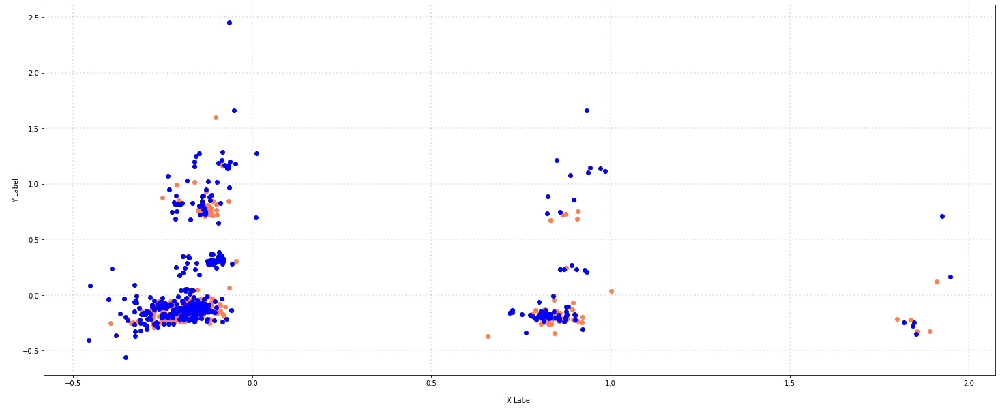

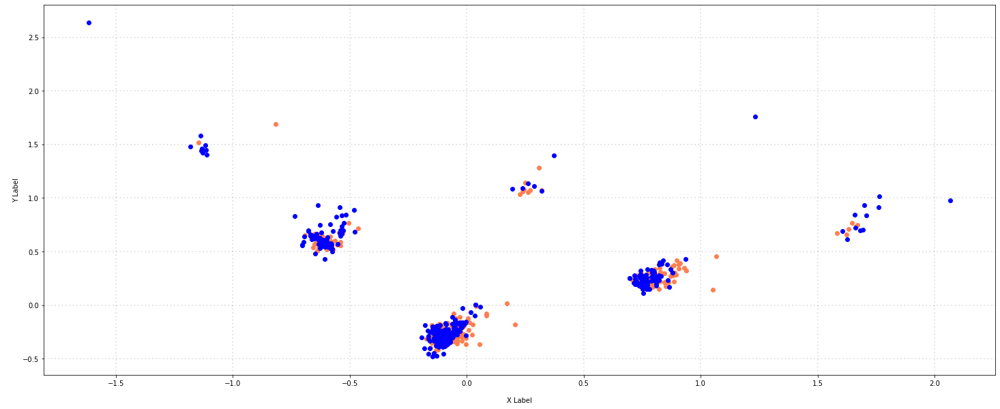

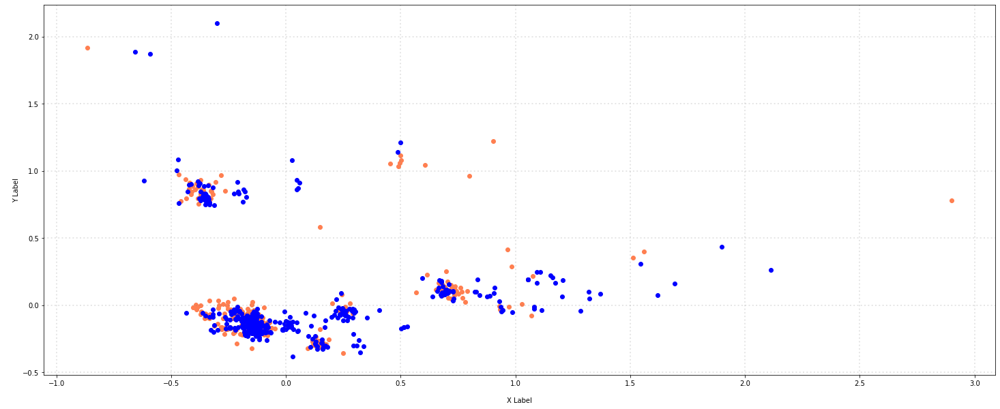

In [53]:
import matplotlib.pyplot as plt
%matplotlib inline
col = ['coral', 'blue']
categories = ['0','1']
# define a function that plots pca values
def plot_2d(col, categories, X_reduced, X):
    fig = plt.figure(figsize = (25,10))
    ax = fig.subplots()
    for c, category in zip(col, categories):
        xs = X_reduced[X['sentiment'] == category].T[0]
        ys = X_reduced[X['sentiment'] == category].T[1]   
        ax.scatter(xs, ys, c = c, marker='o')
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_xlabel('\nX Label')
    ax.set_ylabel('\nY Label')
    plt.show()
plot_2d(col, categories, ama_reduced, df_ama)
plot_2d(col, categories, im_reduced, df_im)
plot_2d(col, categories, yelp_reduced, df_yelp)

Data points with positive/negative sentiments does not seem to be in different areas of the plot, so I proceed to check out the explained variance ration for each data set.

In [54]:
print(pca1.explained_variance_ratio_)
print(pca2.explained_variance_ratio_)
print(pca3.explained_variance_ratio_)

[0.03321268 0.02377547]
[0.02960414 0.02312278]
[0.02546811 0.02012383]


We can see that the explained variance ratios for all three reduced datasets are very small, meaning that it cannot represent the complete datasets very well, so it might not be a good idea to train a classifier using only two pca components.

#### Attribute Transformation / Aggregation

In [55]:
ama_term_frequencies = np.asarray(ama_counts.sum(axis=0))[0]
im_term_frequencies = np.asarray(im_counts.sum(axis=0))[0]
yelp_term_frequencies = np.asarray(yelp_counts.sum(axis=0))[0]
print(ama_term_frequencies[0:10])

[ 9  4  1  1  1  1  1  1  1 26]


In [56]:
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

# define a function that plots the frequency plot sorted by frequency(same code as in the lab's take home excercise)
def plot_sorted_freq_curve(dataset, term_frequencies, feature_names):
    # Sort the term frequency and return its index with argsort, reverse the sequence because argsort gives index starting
    # from the smallest element in the array.
    X_count_rank_idx = term_frequencies.argsort()[(-len(term_frequencies)):][::-1]
    
    fig = go.Figure(                                              # plotly gragh object
        data=[go.Bar(y=term_frequencies[X_count_rank_idx])],
        layout_title_text="Term Frequency " + dataset
    )
    fig.update_yaxes(range=[0,max(term_frequencies)+100])
    fig.update_xaxes(range=[-0.5, 100.5],                         # show first 100, move plot to see the rest
                     tickangle=270,
                     ticktext=np.array(feature_names)[X_count_rank_idx],
                     tickvals=np.arange(0,len(term_frequencies[X_count_rank_idx]),1),
                     tickfont=dict(family='serif', color='black', size=10))                             
    fig.show()
    print('Top 20 words: ',np.array(feature_names)[X_count_rank_idx][0:20]) # print out top ten words
    
    return np.array(feature_names)[X_count_rank_idx][0:20] # return top ranked word for later use

_ = plot_sorted_freq_curve('Amazon',ama_term_frequencies, count_vect_ama.get_feature_names())
_ = plot_sorted_freq_curve('IMBD',im_term_frequencies, count_vect_im.get_feature_names())
_ = plot_sorted_freq_curve('Yelp',yelp_term_frequencies, count_vect_yelp.get_feature_names())

Top 20 words:  ['phone' 'work' 'great' 'good' 'use' 'headset' 'product' 'qualiti'
 'batteri' 'sound' 'one' 'well' 'ear' 'case' 'would' 'price' 'get' 'time'
 'like' 'excel']


Top 20 words:  ['movi' 'film' 'one' 'bad' 'like' 'charact' 'good' 'time' 'watch' 'act'
 'see' 'great' 'realli' 'even' 'love' 'make' 'well' 'scene' 'stori' 'play']


Top 20 words:  ['food' 'place' 'good' 'servic' 'great' 'go' 'back' 'time' 'like' 'realli'
 'love' 'disappoint' 'best' 'wait' 'restaur' 'ever' 'would' 'order' 'get'
 'also']


### Discretization and Binarization

The original sentiment label is only 0 and 1. It it already discretized and binarized.

### Data Exploration
In this section, I try to find out what words are frequently used in positive/negative sentiment sentences.

First, plot out word frequency of positive sentneces sorted by frequency and print top 20 words.

In [57]:
# Calculate term frequencies for positive sentiment sentences
ama_term_frequencies_p = np.asarray(ama_counts[np.where(df_ama.sentiment=='1')[0]].sum(axis=0))[0]
im_term_frequencies_p = np.asarray(im_counts[np.where(df_im.sentiment=='1')[0]].sum(axis=0))[0]
yelp_term_frequencies_p = np.asarray(yelp_counts[np.where(df_yelp.sentiment=='1')[0]].sum(axis=0))[0]

In [58]:
ama_term_frequencies_p

array([3, 3, 1, ..., 2, 1, 0], dtype=int64)

In [59]:
# Calculate term frequencies for negative sentiment sentences
ama_term_frequencies_n = np.asarray(ama_counts[np.where(df_ama.sentiment=='0')[0]].sum(axis=0))[0]
im_term_frequencies_n = np.asarray(im_counts[np.where(df_im.sentiment=='0')[0]].sum(axis=0))[0]
yelp_term_frequencies_n = np.asarray(yelp_counts[np.where(df_yelp.sentiment=='0')[0]].sum(axis=0))[0]

In [60]:
ama_term_frequencies_n

array([6, 1, 0, ..., 1, 0, 1], dtype=int64)

In [61]:
# top 20 words returned for later use
ama_pos_top_20 = plot_sorted_freq_curve('Amazon Positive',ama_term_frequencies_p, count_vect_ama.get_feature_names())
im_pos_top_20 = plot_sorted_freq_curve('IMBD Positive',im_term_frequencies_p, count_vect_im.get_feature_names())
yelp_pos_top_20 = plot_sorted_freq_curve('Yelp Positive',yelp_term_frequencies_p, count_vect_yelp.get_feature_names())

Top 20 words:  ['phone' 'great' 'work' 'good' 'use' 'well' 'headset' 'product' 'sound'
 'qualiti' 'price' 'excel' 'batteri' 'love' 'nice' 'one' 'case' 'comfort'
 'recommend' 'best']


Top 20 words:  ['film' 'movi' 'one' 'good' 'great' 'charact' 'love' 'like' 'well' 'see'
 'play' 'watch' 'wonder' 'best' 'cast' '10' 'time' 'actor' 'act' 'realli']


Top 20 words:  ['good' 'great' 'food' 'place' 'servic' 'love' 'time' 'delici' 'friendli'
 'go' 'back' 'realli' 'nice' 'best' 'amaz' 'like' 'also' 'restaur' 'price'
 'staff']


Second, plot out word frequency of negative sentneces sorted by frequency and print top 20 words.

In [62]:
# top 20 words returned for later use
ama_neg_top_20 = plot_sorted_freq_curve('Amazon Negative',ama_term_frequencies_n, count_vect_ama.get_feature_names())
im_neg_top_20 = plot_sorted_freq_curve('IMBD Negative',im_term_frequencies_n, count_vect_im.get_feature_names())
yelp_neg_top_20 = plot_sorted_freq_curve('Yelp Negative',yelp_term_frequencies_n, count_vect_yelp.get_feature_names())

Top 20 words:  ['phone' 'work' 'use' 'batteri' 'product' 'disappoint' 'ear' 'headset'
 'time' 'one' 'money' 'qualiti' 'wast' 'call' 'buy' 'get' 'first' 'would'
 'sound' 'charg']


Top 20 words:  ['movi' 'film' 'bad' 'one' 'even' 'time' 'act' 'like' 'watch' 'plot'
 'realli' 'charact' 'script' 'make' 'would' 'wast' 'work' 'scene' 'thing'
 'good']


Top 20 words:  ['food' 'place' 'servic' 'go' 'back' 'like' 'time' 'wait' 'disappoint'
 'good' 'never' 'would' 'minut' 'ever' 'eat' 'bad' 'get' 'one' 'order'
 'got']


### Exploration conclusion
From doing aggregation respectively on positive and negative sentences, we can see that positive sentences generally contain "good", "great", while negative sentences contains negative words and aspects that customers/audience are not happy about. For example, from "time", "minute", we can infer that many customers are unhappy because it took too long for the restaurant to serve their meals; from "phone","battery", "charge", we can infer that the customer thinks that the phone he bought on amazon has short battery life and need to charge it again very soon.

### Part3
### New data visualizations
Wordclouds can be generated by using Wordcloud package.

Generate Wordclouds to see what are the most common words that appear in positive/negative sentiment sentences in all three cases.

Using word cloud to visualize the most common words is much better than plotting out barplots(in the data exploration section above). The words that appears more frequently pops right out.

In [63]:
import re
from wordcloud import WordCloud
# get the word cloud function from helpers
def plot_word_cloud(text, title):
    """ Generate word cloud given some input text doc """
    word_cloud = WordCloud().generate(text)
    plt.figure(figsize=(8,6), dpi=300)
    plt.imshow(word_cloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()
# convert all words to lower case
def to_lower(df):
    all_positive = list(df.sentence.iloc[np.where(df.sentiment=='1')[0]])
    print(len(all_positive))
    all_negative = list(df.sentence.iloc[np.where(df.sentiment=='0')[0]])
    print(len(all_negative))
    for i in range(len(all_positive)):
        all_positive[i] = str(all_positive[i]).lower()
    for i in range(len(all_negative)):
        all_negative[i] = str(all_negative[i]).lower()
    return all_positive, all_negative
    
all_p_ama, all_n_ama = to_lower(df_ama)
all_p_im, all_n_im = to_lower(df_im)
all_p_yelp, all_n_yelp = to_lower(df_yelp)

493
497
498
499
499
497


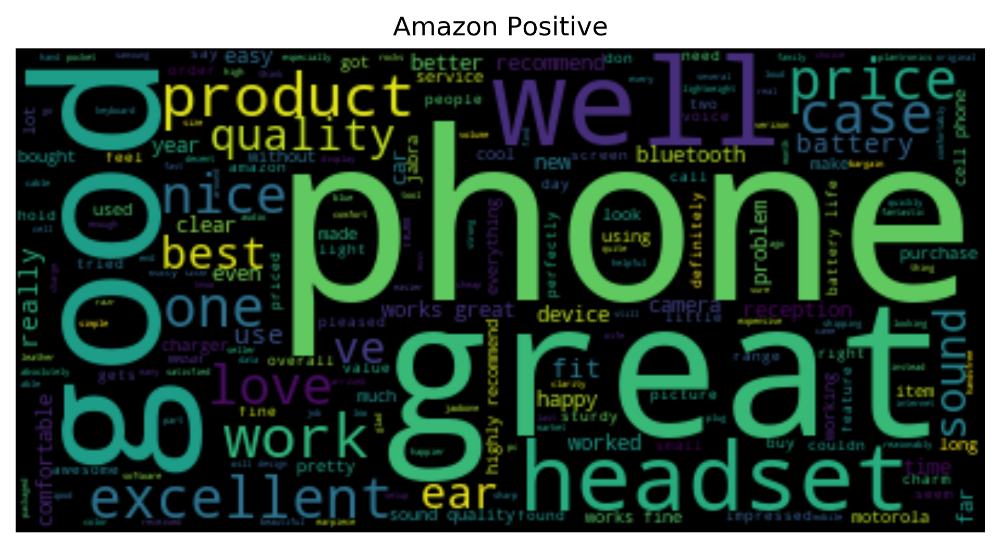

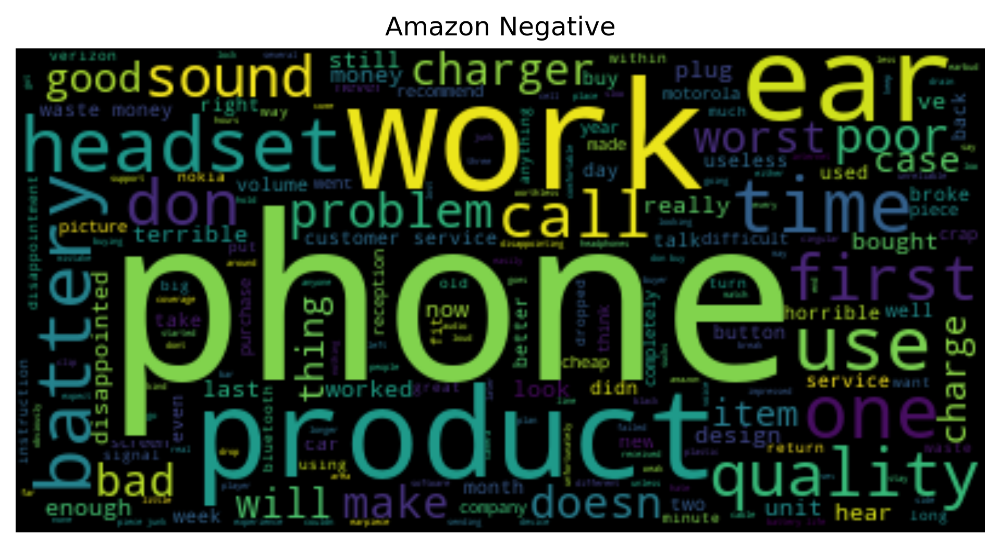

In [64]:
plot_word_cloud(' '.join(all_p_ama), 'Amazon Positive')
plot_word_cloud(' '.join(all_n_ama), 'Amazon Negative')

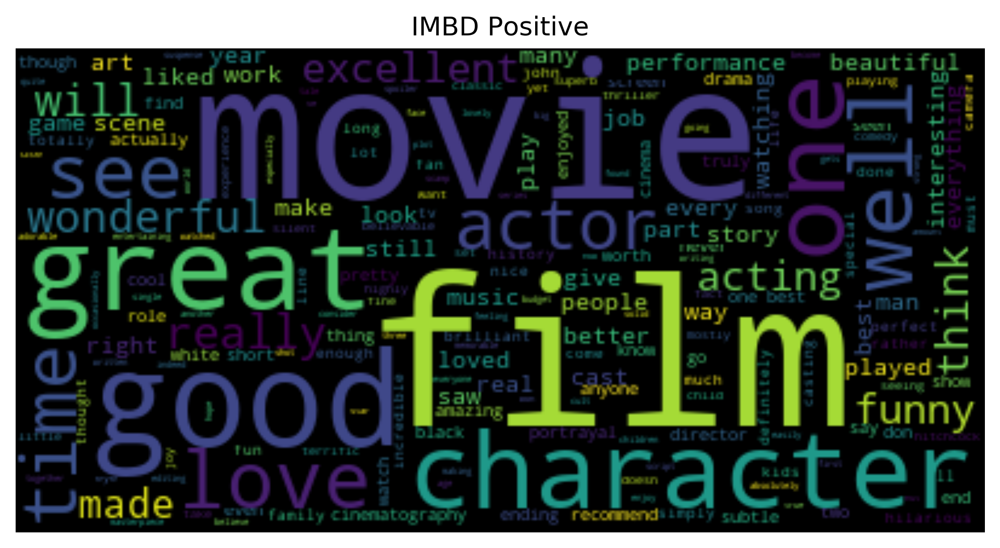

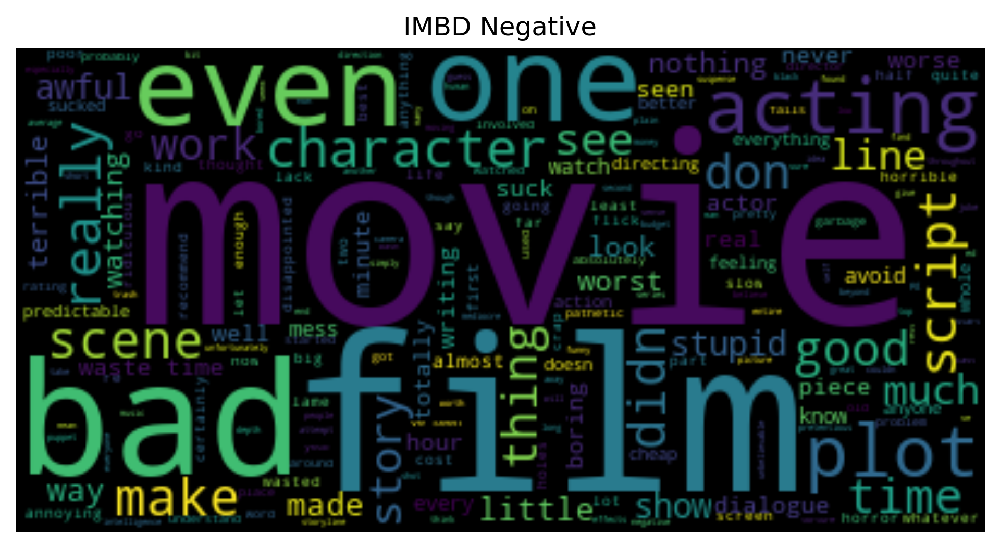

In [65]:
plot_word_cloud(' '.join(all_p_im), 'IMBD Positive')
plot_word_cloud(' '.join(all_n_im), 'IMBD Negative')

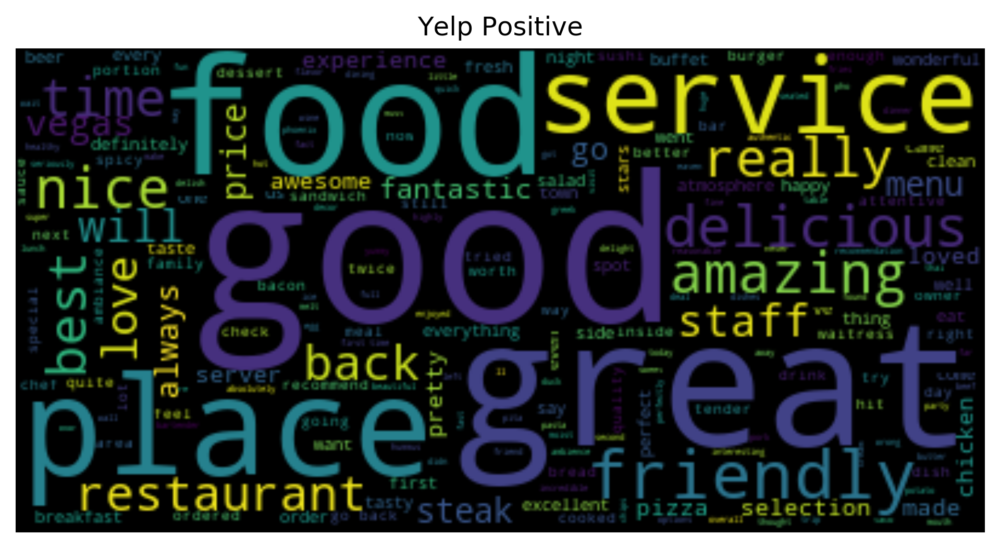

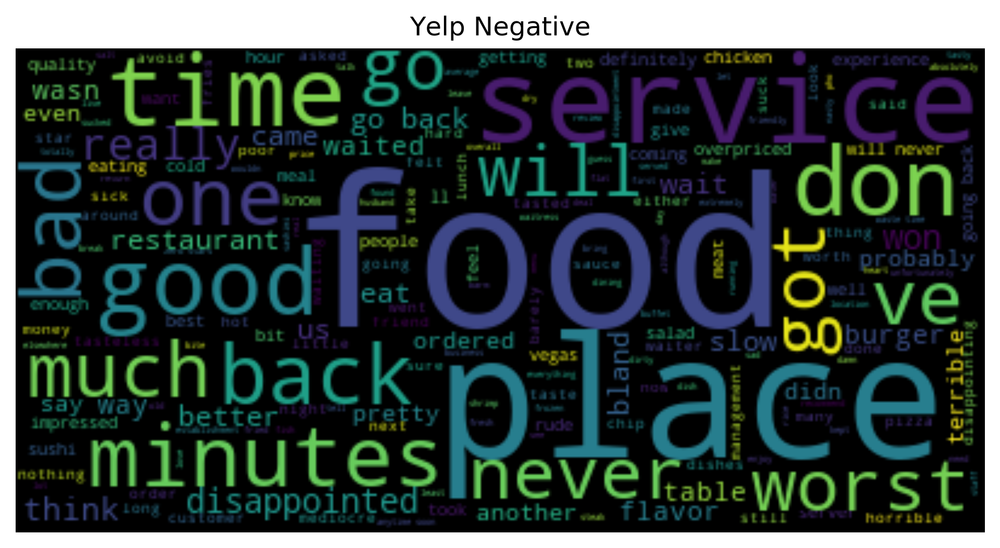

In [66]:
plot_word_cloud(' '.join(all_p_yelp), 'Yelp Positive')
plot_word_cloud(' '.join(all_n_yelp), 'Yelp Negative')

### TF-IDF features from training data
### Naive Bayes classifier
According to the provided reference article, Multinomial naive Bayes is useful to model feature vectors where each value represents the number of occurrences of a term or its relative frequency. So we import Multinomial naive Bayes from sklearn.

We should first split the data into trian/test set before tfidf and classifying.

In [67]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt

# This function plots the confusion matrix of the predicted result
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix')

    print(cm)
    
# This function takes dataframe as input, splits data into train/test, construct tfidf document-term matrix 
# ,  then fit/predict train/test data
def train_tfidf(X,y,data):
    class_names = [0,1]
    # Split the dataset into train/test, make sure the positive/negative ratio is the same in train/test by setting
    # stratify parameter
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42,stratify=y)
    
    # Construct tfidf vectorizer including stop words and word stemming
    tfidf_vect = TfidfVectorizer(stop_words=stop,tokenizer=tokenizer_porter)
    
    # Fit and transform the training data
    tfidf_train = tfidf_vect.fit_transform(X_train)
    
    # Transform the testing data
    tfidf_test = tfidf_vect.transform(X_test)
    
    #Fit the model with different smoothong parameters
    alphas = [0.001, 0.01, 0.1, 1]
    print('Parameters and results for ' + str(data))
    for a in alphas:
        clf = MultinomialNB(alpha=a)
        clf.fit(tfidf_train.toarray(), y_train)
        y_predict = clf.predict(tfidf_test.toarray())
        
        # Calculate the accuracy and uar for each alpha, also plot the confusion matrix
        uar = recall_score(y_test, y_predict, average='macro')
        cm = confusion_matrix(y_test, y_predict)        
        print('alpha = ' + str(a) + '/ accuracy: ' + str(round(clf.score(tfidf_test.toarray(),y_test),4)) \
              + '/ UAR: ' + str(round(uar,4)))
        plot_confusion_matrix(cm , class_names)
        print("")
    print("___________________________________________________________")   

# train and predict
train_tfidf(df_ama.sentence, df_ama.sentiment.astype(int), 'Amazon')
train_tfidf(df_im.sentence, df_im.sentiment.astype(int), 'IMBD')
train_tfidf(df_yelp.sentence, df_yelp.sentiment.astype(int), 'Yelp')

Parameters and results for Amazon
alpha = 0.001/ accuracy: 0.7492/ UAR: 0.7493
Confusion matrix
[[118  46]
 [ 36 127]]

alpha = 0.01/ accuracy: 0.7554/ UAR: 0.7554
Confusion matrix
[[119  45]
 [ 35 128]]

alpha = 0.1/ accuracy: 0.7676/ UAR: 0.7677
Confusion matrix
[[120  44]
 [ 32 131]]

alpha = 1/ accuracy: 0.7645/ UAR: 0.7648
Confusion matrix
[[112  52]
 [ 25 138]]

___________________________________________________________
Parameters and results for IMBD
alpha = 0.001/ accuracy: 0.7576/ UAR: 0.7576
Confusion matrix
[[120  45]
 [ 35 130]]

alpha = 0.01/ accuracy: 0.7576/ UAR: 0.7576
Confusion matrix
[[120  45]
 [ 35 130]]

alpha = 0.1/ accuracy: 0.7576/ UAR: 0.7576
Confusion matrix
[[123  42]
 [ 38 127]]

alpha = 1/ accuracy: 0.7909/ UAR: 0.7909
Confusion matrix
[[124  41]
 [ 28 137]]

___________________________________________________________
Parameters and results for Yelp
alpha = 0.001/ accuracy: 0.7021/ UAR: 0.7021
Confusion matrix
[[115  49]
 [ 49 116]]

alpha = 0.01/ accuracy

### Word frequency features features from training data
### Naive Bayes classifier
We should first split the data into trian/test set before count vectorization and classifying.

In [68]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
    
# This function takes dataframe as input, splits data into train/test sets, construct word frequency document-term matrix 
# ,  then fit/predict train/test data
def train_count(X,y,data):
    class_names = [0,1]
    # Split the dataset into train/test, make sure the positive/negative ratio is the same in train/test by setting
    # stratify parameter
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42,stratify=y)
    
    # Construct count vectorizer including stop words and word stemming
    count_vect = CountVectorizer(stop_words=stop,tokenizer=tokenizer_porter)
    
    # Fit and transform the training data
    count_train = count_vect.fit_transform(X_train)
    print('Vocabulary length = '+str(count_train.shape[1])) # print vocabulary length for later comparison
    
    # Transform the testing data
    count_test = count_vect.transform(X_test)
    
    #Fit the model with different smoothong parameters
    alphas = [0.001, 0.01, 0.1, 1]
    print('Parameters and results for ' + str(data))
    for a in alphas:
        clf = MultinomialNB(alpha=a)
        clf.fit(count_train.toarray(), y_train)
        y_predict = clf.predict(count_test.toarray())
        
        # Calculate the accuracy and uar for each alpha, also plot the confusion matrix
        uar = recall_score(y_test, y_predict, average='macro')
        cm = confusion_matrix(y_test, y_predict)        
        print('alpha = ' + str(a) + '/ accuracy: ' + str(round(clf.score(count_test.toarray(),y_test),4)) \
              + '/ UAR: ' + str(round(uar,4)))
        plot_confusion_matrix(cm , class_names)
        print("")
    print("___________________________________________________________")   

# train and predict
train_count(df_ama.sentence, df_ama.sentiment.astype(int), 'Amazon')
train_count(df_im.sentence, df_im.sentiment.astype(int), 'IMBD')
train_count(df_yelp.sentence, df_yelp.sentiment.astype(int), 'Yelp')

Vocabulary length = 1122
Parameters and results for Amazon
alpha = 0.001/ accuracy: 0.7523/ UAR: 0.7524
Confusion matrix
[[120  44]
 [ 37 126]]

alpha = 0.01/ accuracy: 0.7615/ UAR: 0.7616
Confusion matrix
[[120  44]
 [ 34 129]]

alpha = 0.1/ accuracy: 0.7706/ UAR: 0.7708
Confusion matrix
[[120  44]
 [ 31 132]]

alpha = 1/ accuracy: 0.789/ UAR: 0.7892
Confusion matrix
[[120  44]
 [ 25 138]]

___________________________________________________________
Vocabulary length = 1882
Parameters and results for IMBD
alpha = 0.001/ accuracy: 0.7606/ UAR: 0.7606
Confusion matrix
[[121  44]
 [ 35 130]]

alpha = 0.01/ accuracy: 0.7667/ UAR: 0.7667
Confusion matrix
[[122  43]
 [ 34 131]]

alpha = 0.1/ accuracy: 0.7727/ UAR: 0.7727
Confusion matrix
[[126  39]
 [ 36 129]]

alpha = 1/ accuracy: 0.7848/ UAR: 0.7848
Confusion matrix
[[127  38]
 [ 33 132]]

___________________________________________________________
Vocabulary length = 1281
Parameters and results for Yelp
alpha = 0.001/ accuracy: 0.7386/ U

We can see from the results that with both word frequency features and tfidf features,  accuracy and UAR increase a little as the smoothing parameter increases. Both methods have similar results in terms of accuracy and UAR.

### Word Frequency feature with top frequent words as the vocabulary of Count Vectorizer
From previous data exploration, we found out the top 20 frequent words for both positive and negative sentences. In this section, I tried to see if it is sufficient to use these 40 words(or less if repetition in pos/neg top 20) as the vocabulary for the count vectorizer in all three datasets.

In [69]:
ama_vocab = np.unique(np.concatenate((ama_pos_top_20,ama_neg_top_20))) # contruct vocabulary and remove repetition
print('Amazon vocab length = '+str(len(ama_vocab)))
im_vocab = np.unique(np.concatenate((im_pos_top_20,im_neg_top_20))) # contruct vocabulary and remove repetition
print('IMBD vocab length = '+str(len(im_vocab)))
yelp_vocab = np.unique(np.concatenate((yelp_pos_top_20,yelp_neg_top_20))) # contruct vocabulary and remove repetition
print('Yelp vocab length = '+str(len(yelp_vocab)))

Amazon vocab length = 31
IMBD vocab length = 30
Yelp vocab length = 32


In [70]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import recall_score
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
    
# This function takes dataframe and vocabulary as input, splits data into train/test sets, construct word frequency 
# document-term matrix ,  then fit/predict train/test data
def train_count_v2(X,y,data, vocab):
    class_names = [0,1]
    # Split the dataset into train/test, make sure the positive/negative ratio is the same in train/test by setting
    # stratify parameter
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42,stratify=y)
    
    # Construct count vectorizer including stop words and word stemming
    count_vect = CountVectorizer(stop_words=stop, tokenizer=tokenizer_porter, vocabulary=vocab) # set vocabulary
    
    # Fit and transform the training data
    count_train = count_vect.fit_transform(X_train)
    
    # Transform the testing data
    count_test = count_vect.transform(X_test)
    
    #Fit the model with different smoothong parameters
    alphas = [0.001, 0.01, 0.1, 1]
    print('Parameters and results for ' + str(data))
    for a in alphas:
        clf = MultinomialNB(alpha=a)
        clf.fit(count_train.toarray(), y_train)
        y_predict = clf.predict(count_test.toarray())
        
        # Calculate the accuracy and uar for each alpha, also plot the confusion matrix
        uar = recall_score(y_test, y_predict, average='macro')
        cm = confusion_matrix(y_test, y_predict)        
        print('alpha = ' + str(a) + '/ accuracy: ' + str(round(clf.score(count_test.toarray(),y_test),4)) \
              + '/ UAR: ' + str(round(uar,4)))
        plot_confusion_matrix(cm , class_names)
        print("")
    print("___________________________________________________________") 

# train and predict
train_count_v2(df_ama.sentence, df_ama.sentiment.astype(int), 'Amazon', ama_vocab)
train_count_v2(df_im.sentence, df_im.sentiment.astype(int), 'IMBD', im_vocab)
train_count_v2(df_yelp.sentence, df_yelp.sentiment.astype(int), 'Yelp', yelp_vocab)

Parameters and results for Amazon
alpha = 0.001/ accuracy: 0.7156/ UAR: 0.7153
Confusion matrix
[[135  29]
 [ 64  99]]

alpha = 0.01/ accuracy: 0.7156/ UAR: 0.7153
Confusion matrix
[[135  29]
 [ 64  99]]

alpha = 0.1/ accuracy: 0.7156/ UAR: 0.7153
Confusion matrix
[[135  29]
 [ 64  99]]

alpha = 1/ accuracy: 0.7125/ UAR: 0.7122
Confusion matrix
[[135  29]
 [ 65  98]]

___________________________________________________________
Parameters and results for IMBD
alpha = 0.001/ accuracy: 0.6788/ UAR: 0.6788
Confusion matrix
[[130  35]
 [ 71  94]]

alpha = 0.01/ accuracy: 0.6788/ UAR: 0.6788
Confusion matrix
[[130  35]
 [ 71  94]]

alpha = 0.1/ accuracy: 0.6788/ UAR: 0.6788
Confusion matrix
[[130  35]
 [ 71  94]]

alpha = 1/ accuracy: 0.6788/ UAR: 0.6788
Confusion matrix
[[130  35]
 [ 71  94]]

___________________________________________________________
Parameters and results for Yelp
alpha = 0.001/ accuracy: 0.6505/ UAR: 0.6501
Confusion matrix
[[ 86  78]
 [ 37 128]]

alpha = 0.01/ accuracy

From the result above, we can achieve more than 80% of the performance  in all three cases by using less than 40 words as our vocabulary instead of 1000+ words previously. Selecting top frequent words as vocabulary in this case is a effective way of reducing the dimension of our data.

### Part4

In the lab part, stop words and punctuations are not removed from the data when creating document-term matrix, also, words are not stemmed. We can download stop words from nltk and import PorterStemmer function, and then include both into the count vectorizer function. 

In the dimension reduction part, data points for different categories does not seem separated, so it might not be a good idea to use so few pca components to train our classification model.